In [638]:
import sqlite3
import requests
import time
from matplotlib.lines import Line2D
from matplotlib.patches import Patch
from tqdm import tqdm_notebook

%matplotlib inline
import networkx as nx
import matplotlib.pyplot as plt

In [120]:
conn = sqlite3.connect("db_with_friends.db") 
cursor = conn.cursor()
 
#Создание таблицы

cursor.execute("""CREATE TABLE Friends
                ( friend_id int, first_name text, last_name text, bdate text, city text, sex int, home_town text,
                occupation_type text, occupation_name text, universities text )
           """)

In [163]:
#cursor.execute("""DROP Table  Friends""")
conn = sqlite3.connect("db_with_friends.db") 
cursor = conn.cursor()

#cursor.execute("""ALTER TABLE Friends add common_friends  text""")


In [480]:
token='**'
link = "https://api.vk.com/method/users.get?user_id=12578092&fields=bdate, city, home_town, universities,occupation,sex&v=5.21&access_token=" + token


In [481]:
response = requests.get(link)
print(response.status_code)
tree = response.json()
tree['response']


200


[{'id': 12578092,
  'first_name': 'Зорикто',
  'last_name': 'Доржиев',
  'sex': 2,
  'bdate': '7.5',
  'city': {'id': 1675, 'title': 'Могойтуй'},
  'occupation': {'type': 'university',
   'id': 22268,
   'name': 'California Institute of Technology (Caltech)'}}]

In [368]:
link_friends = "https://api.vk.com/method/friends.get?user_id=62148144&v=5.21&access_token=" + token
response = requests.get(link_friends)
my_friends = response.json()['response']['items']
print(len(my_friends))


301


In [ ]:
for friend_id in my_friends:
    print(friend_id)
    time.sleep(0.5)
    link = "https://api.vk.com/method/users.get?user_id="+str(friend_id)+"&fields=bdate, city, home_town, universities,occupation,sex&v=5.21&access_token=" + token
    response = requests.get(link)
    tree = response.json()
    
    try:
        occupation_type = tree['response'][0]['occupation']['type']
    except KeyError:
        occupation_type = ""
        
    try:
        occupation_name = tree['response'][0]['occupation']['name'] 
    except KeyError:
        occupation_name = ""
        
    first_name = tree['response'][0]['first_name']
    last_name = tree['response'][0]['last_name']
    sex = tree['response'][0]['sex']
    
    try:
        bdate = tree['response'][0]['bdate']  
    except KeyError:
        bdate = ''
        
    try:
        city = tree['response'][0]['city']['title']
        
    except KeyError:
        city = ""
        
    try:
        universities = str(tree['response'][0]['universities'])
        
    except KeyError:
        universities = ""
        
    try: 
        home_town = tree['response'][0]['home_town']
    except KeyError:
        home_town = ""
    cursor.execute("INSERT INTO Friends VALUES (?,?,?,?,?,?,?,?,?,?)", (friend_id, first_name, last_name, bdate, city,sex,
                                                       home_town, occupation_type, occupation_name,universities ))
    conn.commit()
    
    

In [379]:


for my_friend in tqdm_notebook(my_friends):
    time.sleep(0.5)
    #print(my_friend)
    link_friends = "https://api.vk.com/method/friends.get?user_id="+str(my_friend)+"&v=5.21&access_token=" + token
    response = requests.get(link_friends)
    friends_friends = response.json()['response']['items']
    common_friends = list(set(friends_friends)&set(my_friends))
    
    cursor.execute("UPDATE Friends SET common_friends = ? WHERE friend_id = ? ", (str(common_friends)[1:-1], my_friend))
    conn.commit()

In [371]:
my_id = 62148144
len(my_friends)

301

In [705]:
G = nx.Graph()
G.add_node(my_id) 
for i in my_friends:
    G.add_edge(my_id,i)
    f_friends = get_ffriends(i)
    for friend in f_friends:
        G.add_edge(i, friend)
        
    

In [751]:
def get_ffriends(_id):
    sql = "SELECT common_friends FROM Friends where friend_id = ?"
    cursor.execute(sql,[_id])
    s = cursor.fetchall()[0][0]
    if (len(s)== 0):
        l = []
    else:
        l = [int(n) for n in str.split(s,",")]
    return l
    
def draw_graph(G, color,legend_elements):
    hub_ego = nx.ego_graph(G, my_id)
    pos = nx.spring_layout(hub_ego)
    plt.rcParams["figure.figsize"] = (20,15)
    nx.draw(hub_ego, pos, node_color=color, node_size=450, with_labels=False)
    plt.legend(handles=legend_elements,loc=3, prop={'size': 20})
    plt.show()
    

## My Graph

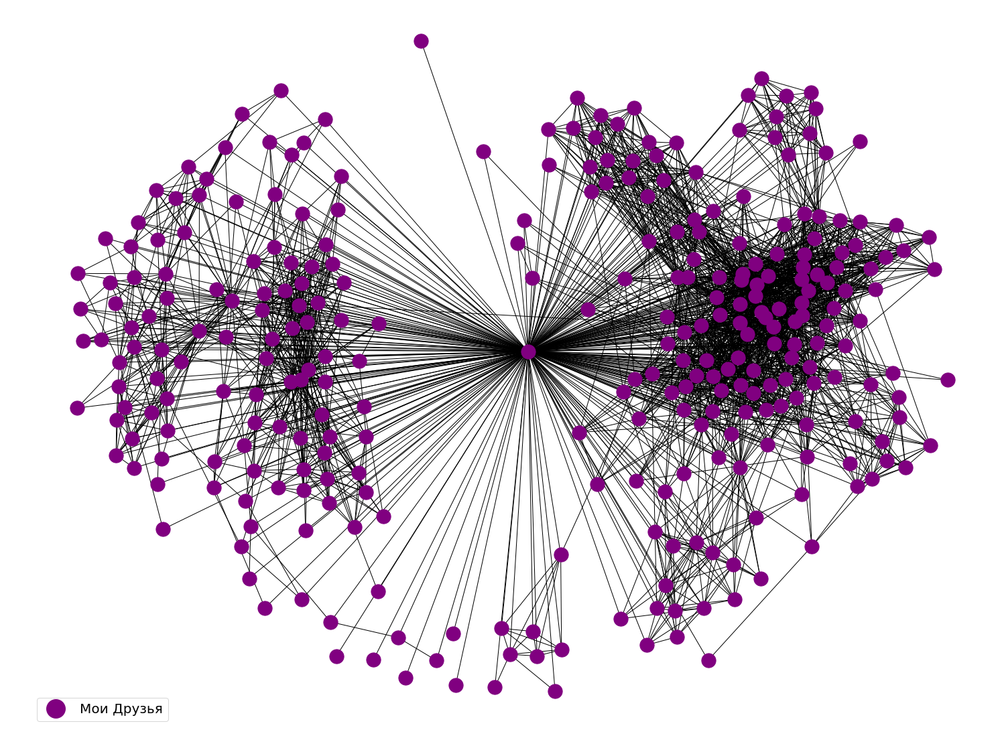

In [753]:

legend_elements = [Line2D([0], [0], marker='o', color='w', label='Мои Друзья',
                          markerfacecolor='purple', markersize=30)]
draw_graph(G, 'purple', legend_elements)

# Пол 

In [754]:
node_color = []
for _id in G:
    #sex = cursor.fetchone()[0]
    if (_id == my_id):
        node_color.append('white')
    else:
        sql = "SELECT sex FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        sex = cursor.fetchone()[0]
        
        if (sex == 1):
            node_color.append('purple')
        else:
            node_color.append('darkblue')
        

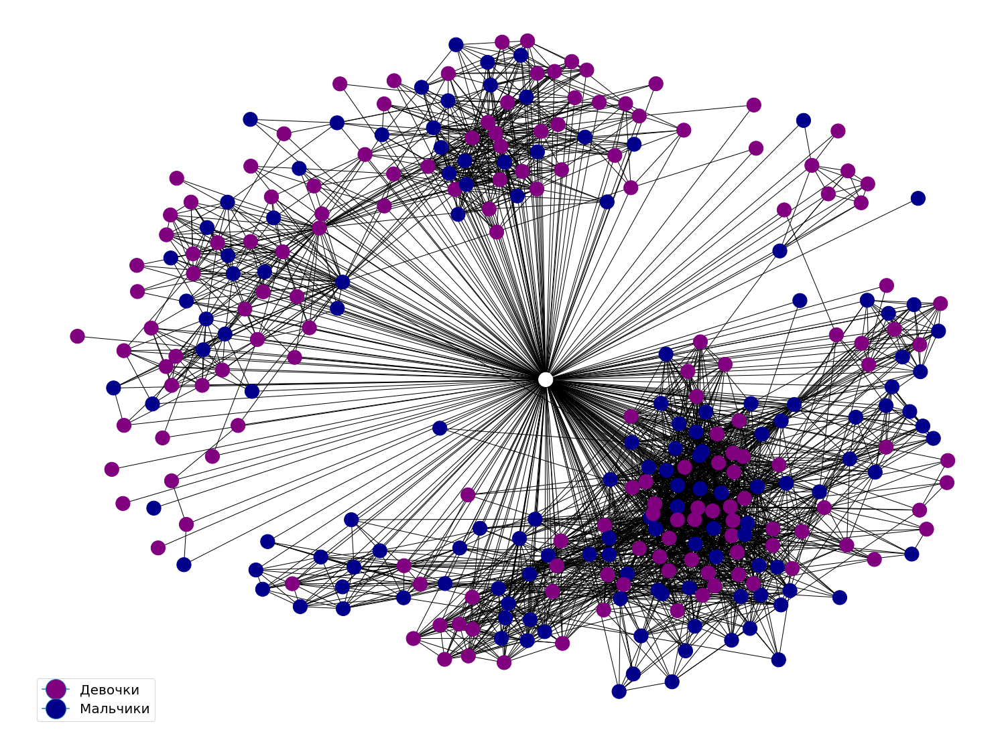

In [755]:
legend_elements = [Line2D([0], [0], marker='o',  label='Девочки',
                          markerfacecolor='purple', markersize=30),
                  Line2D([0], [0], marker='o',  label='Мальчики',
                          markerfacecolor='darkblue', markersize=30)]
draw_graph(G, node_color,legend_elements)


## текущее место проживания

In [756]:
node_color = []

for _id in G:
    #sex = cursor.fetchone()[0]
    if (_id == my_id):
        node_color.append('black')
    else:
        sql = "SELECT city FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        city = cursor.fetchone()[0]
        if (city == 'Санкт-Петербург'):
            node_color.append('forestgreen')

            
        elif (city == 'Ульяновск'):
            node_color.append('royalblue')
            
        elif (city == 'Москва'):
            node_color.append('firebrick')
            
        else: 
            node_color.append('lightgray')
        

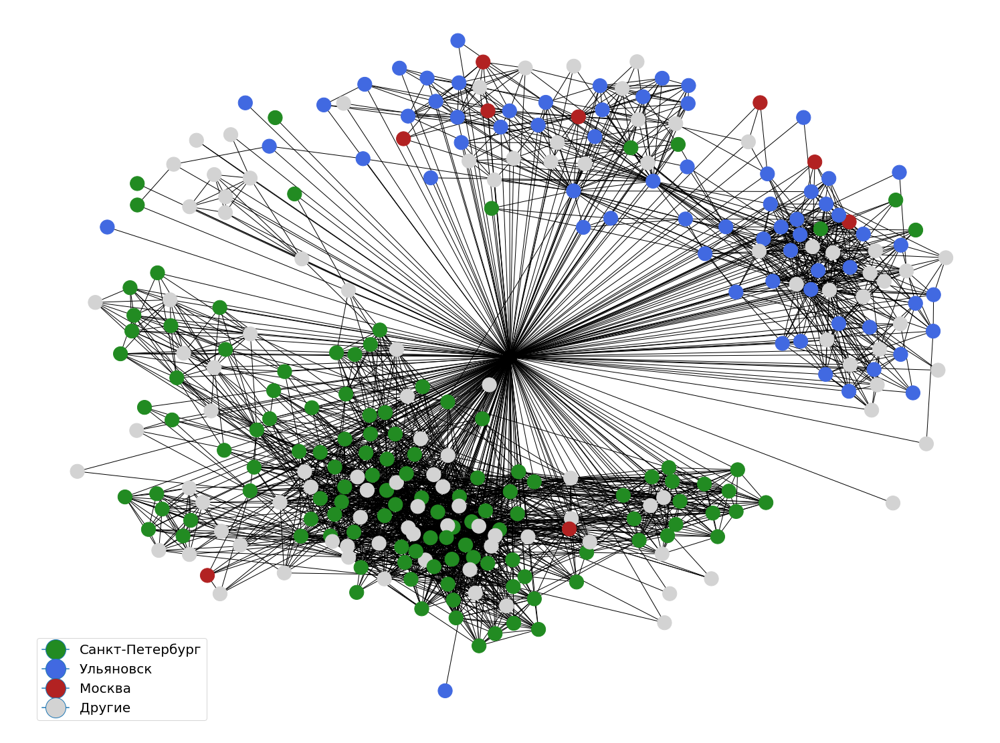

In [757]:
legend_elements = [
                   Line2D([0], [0], marker='o', label='Санкт-Петербург',
                          markerfacecolor='forestgreen', markersize=30),
                    Line2D([0], [0], marker='o', label='Ульяновск',
                          markerfacecolor='royalblue', markersize=30),
                  Line2D([0], [0], marker='o', label='Москва',
                          markerfacecolor='firebrick', markersize=30),
                   Line2D([0], [0], marker='o', label='Другие',
                          markerfacecolor='lightgray', markersize=30)
                  ]
draw_graph(G, node_color,legend_elements)

## Родной город

In [758]:
node_color = []
for _id in G:
    #sex = cursor.fetchone()[0]
    if (_id == my_id):
        node_color.append('black')
    else:
        sql = "SELECT home_town FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        city = cursor.fetchone()[0]
        if (city == 'Санкт-Петербург' or city == "Saint-Petersburg" or city == "СПб" or city == "Лениград"):
            node_color.append('forestgreen')
            
        elif (city == 'Ульяновск' or city == 'ульяновск' or city == "Ульяновск."):
            node_color.append('firebrick')
            
        elif (city == 'Краснодар' or city == "Krasnodar"):
            node_color.append('yellow')
            
        elif (city == 'Кемерово'):
            node_color.append('b')
            
        elif (city == 'Иркутск'):
            node_color.append('deeppink')
            
        elif (city == 'Хабаровск'):
            node_color.append('darkorange')
        else: 
            node_color.append('lightgrey')

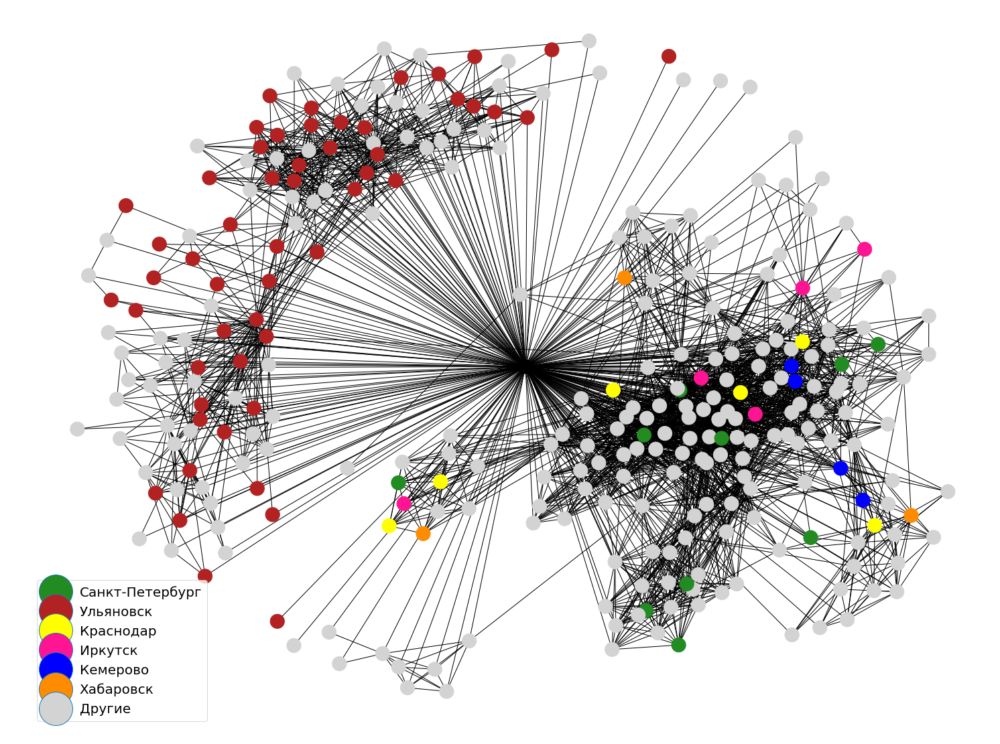

In [759]:
legend_elements = [Line2D([0], [0], marker='o',  label='Санкт-Петербург',
                          markerfacecolor='forestgreen', markersize=50),
                  Line2D([0], [0], marker='o',  label='Ульяновск',
                          markerfacecolor='firebrick', markersize=50),
                   Line2D([0], [0], marker='o',  label='Краснодар',
                          markerfacecolor='yellow', markersize=50),
                  Line2D([0], [0], marker='o',  label='Иркутск',
                          markerfacecolor='deeppink', markersize=50),
                  Line2D([0], [0], marker='o',  label='Кемерово',
                          markerfacecolor='b', markersize=50),
                  Line2D([0], [0], marker='o',  label='Хабаровск',
                          markerfacecolor='darkorange', markersize=50),
                  Line2D([0], [0], marker='o',  label='Другие',
                          markerfacecolor='lightgrey', markersize=50)]
draw_graph(G, node_color,legend_elements)                 


# Текущий статус

In [760]:
node_color = []
for _id in G:
    #sex = cursor.fetchone()[0]
    if (_id == my_id):
        node_color.append('black')
    else:
        sql = "SELECT occupation_type FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        occupation_type = cursor.fetchone()[0]
       
        if (occupation_type == 'university'):
            node_color.append('forestgreen')
            
        elif (occupation_type == 'work'):
            node_color.append('darkblue')
            
        elif (occupation_type == 'school'):
            node_color.append('firebrick')
        else: 
            node_color.append('lightgray')
        

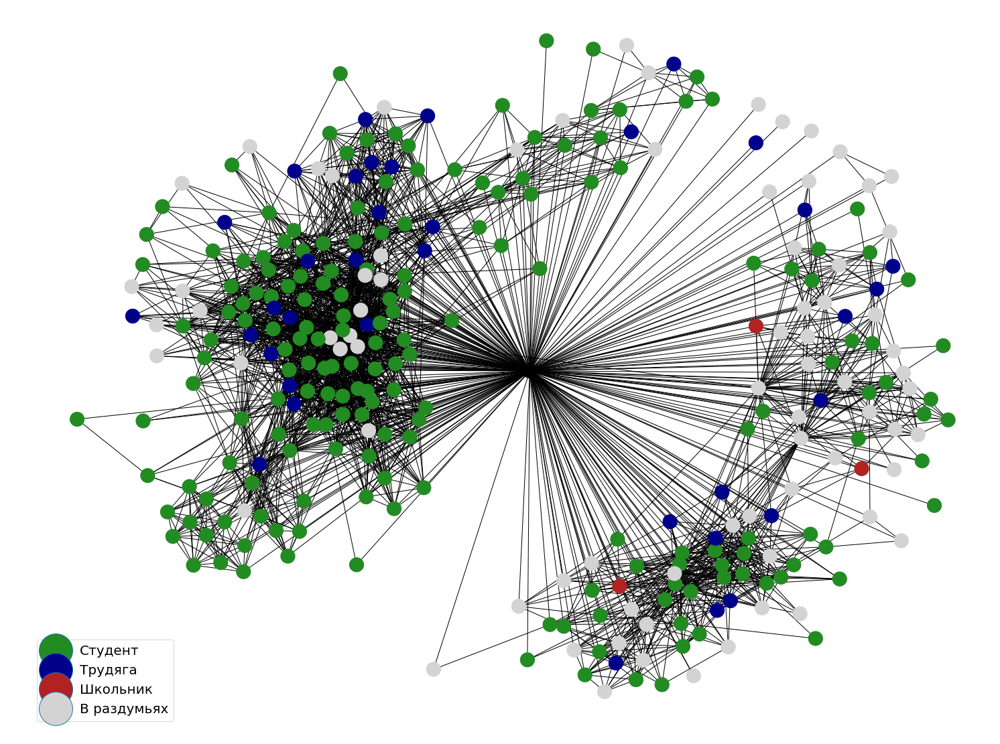

In [761]:
legend_elements = [Line2D([0], [0], marker='o',  label='Студент',
                          markerfacecolor='forestgreen', markersize=50),
                  Line2D([0], [0], marker='o',  label='Трудяга',
                          markerfacecolor='darkblue', markersize=50),
                   Line2D([0], [0], marker='o',  label='Школьник',
                          markerfacecolor='firebrick', markersize=50),
                  Line2D([0], [0], marker='o',  label='В раздумьях',
                          markerfacecolor='lightgray', markersize=50)]
draw_graph(G, node_color,legend_elements)   

## ПМ-ПУ vs Матмех

In [762]:
node_color = []
for _id in G:
    if (_id == my_id):
        node_color.append('black')
    else:
        sql = "SELECT universities FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        s = cursor.fetchone()[0]
    
        try:
                    faculty = eval(s)
                    faculty = faculty[0]['faculty']
        except:
                faculty = 0


        if (faculty == 7):
            node_color.append('firebrick')

        elif (faculty == 11):
            node_color.append('royalblue')

        else: 
                 node_color.append('grey')


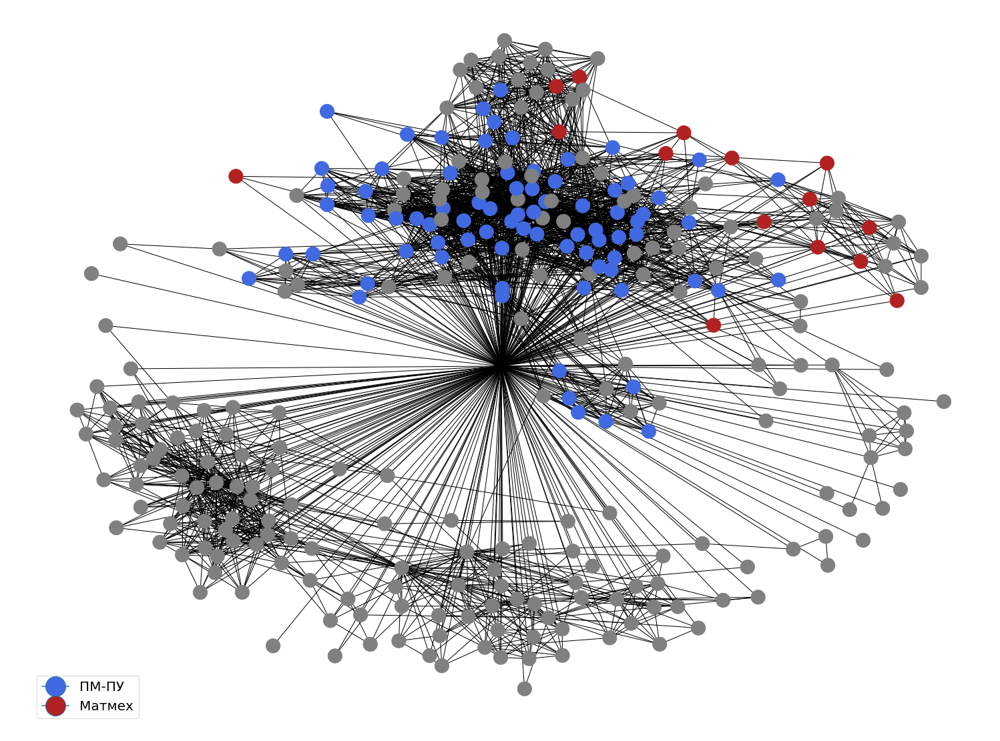

In [764]:
legend_elements = [Line2D([0], [0], marker='o',  label='ПМ-ПУ',
                          markerfacecolor='royalblue', markersize=30),
                  Line2D([0], [0], marker='o',  label='Матмех',
                          markerfacecolor='firebrick', markersize=30)]

draw_graph(G, node_color,legend_elements)   

# Множественность

## 2

In [765]:
node_color = []

for _id in G:
    #sex = cursor.fetchone()[0]
    if (_id == my_id):
        node_color.append('black')
    else:
        sql = "SELECT bdate, sex FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        res = cursor.fetchone()
        sex = res[1]
        date = str.split(res[0], ".", maxsplit=2)
        if (len(date)>1):
            day = int(date[0])
            month = int(date[1])

            if ( sex==2 and ((day>=22)and(month == 8))or((day<=23)and(month==9))):
                node_color.append('purple')
            else: 
                node_color.append('lightgray')
        else: 
                node_color.append('lightgray')

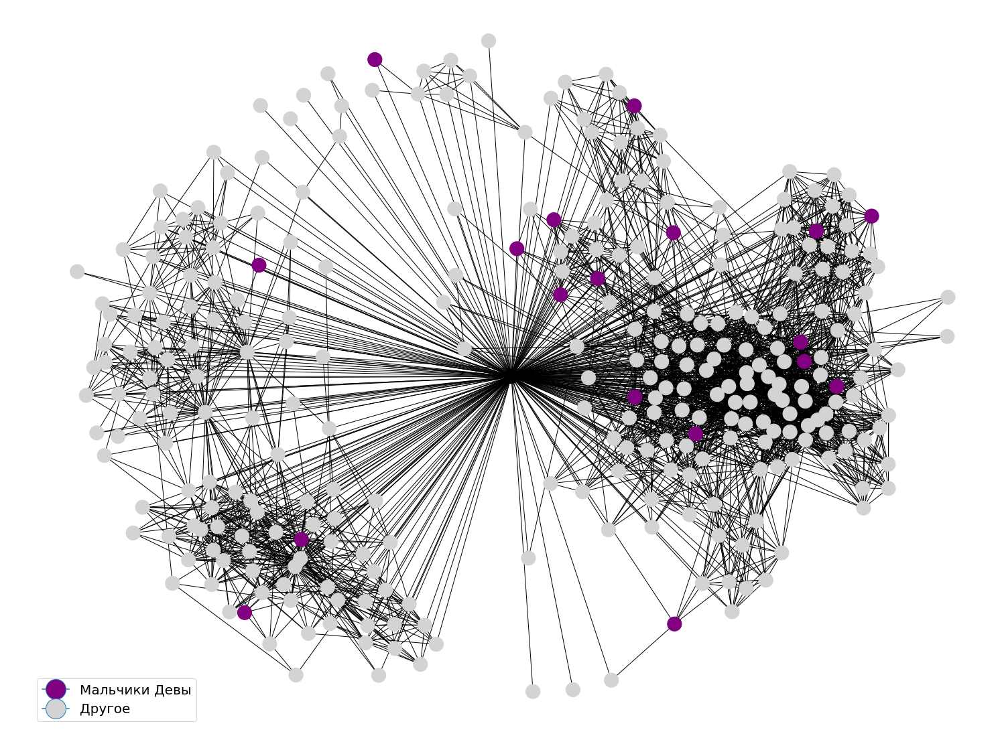

In [767]:
legend_elements = [Line2D([0], [0], marker='o',  label='Мальчики Девы',
                          markerfacecolor='purple', markersize=30),
                  Line2D([0], [0], marker='o',  label='Другое',
                          markerfacecolor='lightgray', markersize=30)]

draw_graph(G, node_color,legend_elements)

## 3 : наличие высшего образование, наличие работы, провинциальный город

In [768]:
node_color = []

for _id in G:
    #sex = cursor.fetchone()[0]
    if (_id == my_id):
        node_color.append('black')
    else:
        sql = "SELECT universities,occupation_type, city FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        res = cursor.fetchone()
        uni = res[0]
        type_ = res[1]
        home_town = res[2]
        if (len(uni) != 0 and type_ == "work" and home_town == "Ульяновск"):
                node_color.append('deepskyblue')
 
        else: 
                node_color.append('lightgray')

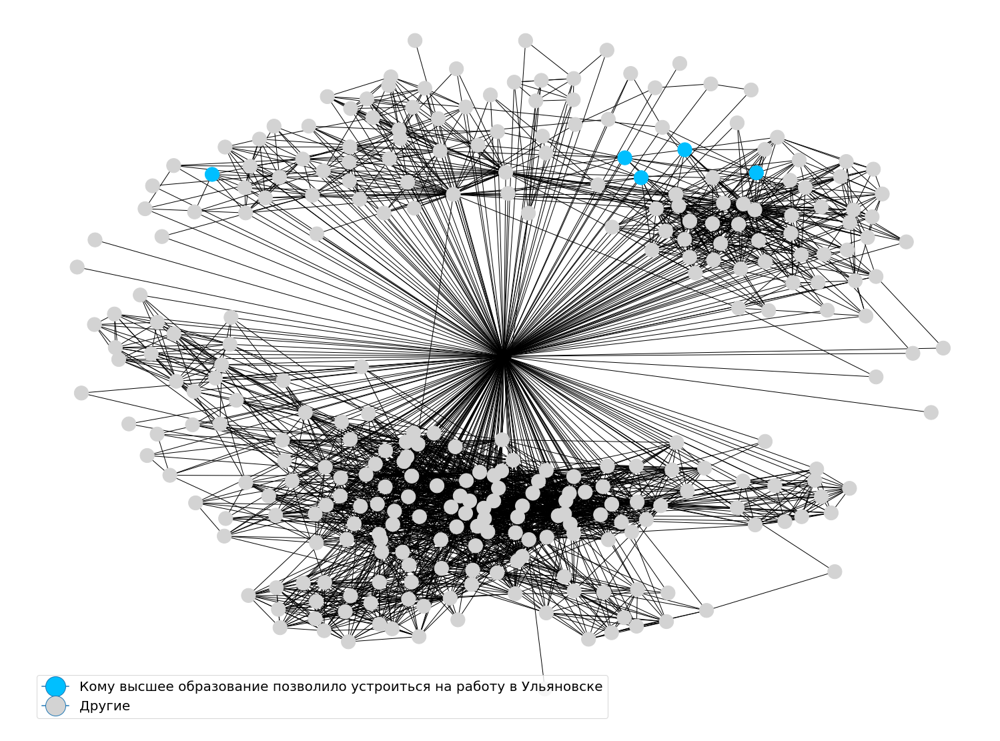

In [769]:
legend_elements = [Line2D([0], [0], marker='o',  label='Кому высшее образование позволило устроиться на работу в Ульяновске',
                          markerfacecolor='deepskyblue', markersize=30),
                  Line2D([0], [0], marker='o',  label='Другие',
                          markerfacecolor='lightgray', markersize=30)]

draw_graph(G, node_color,legend_elements)   

## 4 Девочки из одной школы в Ульяновске, которые мечтали жить в Питере и их мечта сбылась

In [770]:
node_color = []

for _id in G:
    #sex = cursor.fetchone()[0]
    if (_id == my_id):
        node_color.append('deepskyblue')
    else:
        sql = "SELECT city, occupation_type, sex, home_town FROM Friends where friend_id = ?"
        cursor.execute(sql,[_id])
        res = cursor.fetchone()
        city = res[0]
        occupation_type = res[1]
        sex = res[2]
        home_town = res[3]
        if (city == "Санкт-Петербург" and sex == 1 and home_town == "Ульяновск"):
            node_color.append('deepskyblue')  

        else: 
                node_color.append('lightgray')

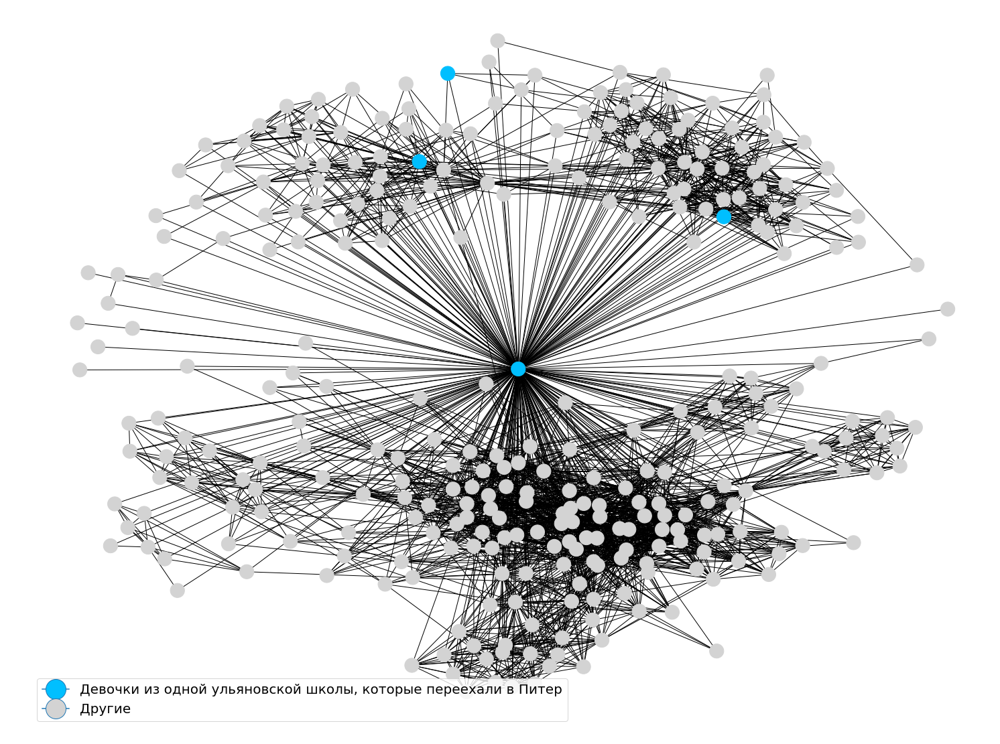

In [771]:
legend_elements = [Line2D([0], [0], marker='o',  label='Девочки из одной ульяновской школы, которые переехали в Питер',
                          markerfacecolor='deepskyblue', markersize=30),
                  Line2D([0], [0], marker='o',  label='Другие',
                          markerfacecolor='lightgray', markersize=30)]

draw_graph(G, node_color,legend_elements)   